<a href="https://colab.research.google.com/github/ffabi/VehicleOrientation/blob/master/VehicleOrientation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Connect to google drive


In [0]:
from google.colab import drive 
drive.mount('/content/gdrive')

#change working directory to google drive
import os
os.chdir("/gdrive/My Drive/VehicleOrientation")


#Import and install everything

In [17]:
!apt -qq install tree

import os
from decimal import Decimal
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.image as mpimg

nb_vehicles = 20

tree is already the newest version (1.7.0-5).
0 upgraded, 0 newly installed, 0 to remove and 8 not upgraded.


#Acquire dataset

In [0]:
#https://cvlab.epfl.ch/data/data-pose-index-php/

# The dataset on this page contains 20 sequences of cars as they rotate by 360 degrees. There is one image approximately every 3-4 degrees.
# Using the time of capture information from the photos, it is possible to calculate the approximate rotation angle of the car.

# The photos have been captured using a Nikon D70 camera on a tripod at the Geneva International Motor Show ’08.
# The lens used is Nikkor 12-24mm DX f/4. The focal length was kept constant during a single sequence (showing a single car) but varies
# from sequence to sequence. The focus was set to manual, approx. at the hyperfocal distance.

# All videos and images available from this page are copyrighted by CVLab – EPFL. You are free to use them for research purposes.
# If you use them to publish results, please cite the reference below.

!wget https://documents.epfl.ch/groups/c/cv/cvlab-multiview-car-dataset/www/epfl_gims08.tar.gz

--2018-12-12 19:42:14--  https://documents.epfl.ch/groups/c/cv/cvlab-multiview-car-dataset/www/epfl_gims08.tar.gz
Resolving documents.epfl.ch (documents.epfl.ch)... 128.178.222.31
Connecting to documents.epfl.ch (documents.epfl.ch)|128.178.222.31|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 183434737 (175M) [application/x-gzip]
Saving to: ‘epfl_gims08.tar.gz.1’

epfl_gims08.tar.gz. 100%[===================>] 174.94M  1.51MB/s    in 1m 52s  

2018-12-12 19:44:06 (1.57 MB/s) - ‘epfl_gims08.tar.gz.1’ saved [183434737/183434737]



In [0]:
!tar -xzf epfl_gims08.tar.gz

In [0]:
!mv epfl-gims08 vehicle_dataset

In [0]:
nb_vehicles = 20

In [0]:
#move the images to a separate folder

directory = "vehicle_dataset/images"

if not os.path.exists(directory):
    os.mkdir(directory)

for i in range(1, nb_vehicles+1):
    
    directory = "vehicle_dataset/images/" + str(i)
    
    if not os.path.exists(directory):
        os.mkdir(directory)
    
    from_file = "vehicle_dataset/tripod-seq/tripod_seq_" + ("0" if i < 10 else "") + str(i) + "*jpg"
    to_file = directory

    command = "mv " + from_file + " " + to_file
    
    os.system(command)

In [0]:
!rm vehicle_dataset/tripod-seq/*.jpg

In [0]:
!mv vehicle_dataset/tripod-seq vehicle_dataset/image_data

In [0]:
!tree -P *001.jpg .

.
└── vehicle_dataset
    ├── image_data
    └── images
        ├── 1
        │   └── tripod_seq_01_001.jpg
        ├── 10
        │   └── tripod_seq_10_001.jpg
        ├── 11
        │   └── tripod_seq_11_001.jpg
        ├── 12
        │   └── tripod_seq_12_001.jpg
        ├── 13
        │   └── tripod_seq_13_001.jpg
        ├── 14
        │   └── tripod_seq_14_001.jpg
        ├── 15
        │   └── tripod_seq_15_001.jpg
        ├── 16
        │   └── tripod_seq_16_001.jpg
        ├── 17
        │   └── tripod_seq_17_001.jpg
        ├── 18
        │   └── tripod_seq_18_001.jpg
        ├── 19
        │   └── tripod_seq_19_001.jpg
        ├── 2
        │   └── tripod_seq_02_001.jpg
        ├── 20
        │   └── tripod_seq_20_001.jpg
        ├── 3
        │   └── tripod_seq_03_001.jpg
        ├── 4
        │   └── tripod_seq_04_001.jpg
        ├── 5
        │   └── tripod_seq_05_001.jpg
        ├── 6
        │   └── tripod_seq_06_001.jpg
        ├── 7
        │   └── tripod_seq_07_001.j

#Preprocess dataset

In [0]:
#additional information about the vehicle
#first column is rotation direction
#second column is the index of the image taken from the back of the car
#third column is the period time of rotation given in number of images

base_data = np.array([], dtype=[('rotation', str, 20), ('back', int, 1), ('period', int, 1)])


manual = np.array([

("clockwise", 1, 0),
("clockwise", 22, 0),
("clockwise", 52, 0),
("clockwise", 55, 0),
("counterclockwise", 62, 0),
("clockwise", 92, 0),
("clockwise", 123, 0),
("clockwise", 7, 0),
("clockwise", 75, 0),
("counterclockwise", 76, 0),
("counterclockwise", 19, 0),
("counterclockwise", 68, 0),
("clockwise", 8, 0),
("counterclockwise", 50, 0),
("counterclockwise", 45, 0),
("counterclockwise", 71, 0),
("clockwise", 6, 0),
("counterclockwise", 33, 0),
("counterclockwise", 3, 0),
("clockwise", 16, 0)

], dtype=[('rotation', str, 20), ('back', int, 1), ('period', int, 1)])

base_data = np.append(base_data, manual, axis=0)

In [0]:
def get_image(vehicle_id=1, image_id=1):
    filename = "vehicle_dataset/images/" + str(vehicle_id) + "/tripod_seq_" + ("0" if vehicle_id < 10 else "") \
                + str(i) + "_" + ("00" if image_id < 10 else ("0" if image_id < 100 else "")) + str(image_id) + ".jpg"
    return mpimg.imread(filename)

In [0]:
back_images = []
for i in range(1, nb_vehicles+1):
    index = base_data["back"][i-1]
    back_images.append(get_image(i, index))


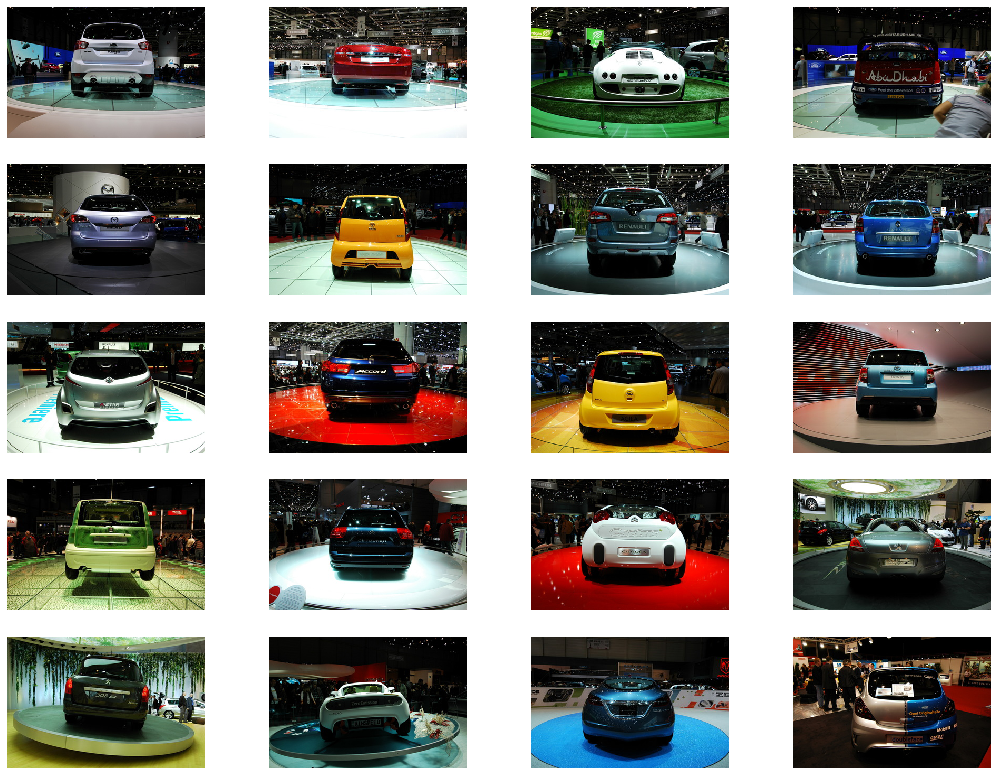

In [85]:
fig=plt.figure(figsize=(18, 14))
columns = 4
rows = nb_vehicles//columns
for i in range(1, columns*rows +1):
    ax = fig.add_subplot(rows, columns, i)
    ax.set_xticks(())
    ax.set_yticks(())
    plt.imshow(back_images[i-1])
plt.show()

In [0]:

def mse(imageA, imageB):

	err = np.sum((imageA.astype("float") - imageB.astype("float")) ** 2)
	err /= float(imageA.shape[0] * imageA.shape[1])
	
	return err

In [88]:
#calculate the period time (number of frames for one rotation)
for i in range(1, nb_vehicles+1):
    
    print("Processing car No. " + str(i))

    filename = "vehicle_dataset/image_data/bbox_" + ("0" if i < 10 else "") + str(i) + ".txt"

    with open(filename) as file:
        lines = file.readlines()

    first_image = get_image(i, 1)
    
    min_value=9999
    min_index=0
    
    for j in range(5, len(lines)+1):

        n_image = get_image(i, j)
        
        diff = mse(first_image, n_image)
        
        if diff < min_value:
            min_value = diff
            min_index = j
        

    base_data["period"][i-1] = min_index
    


Processing car No. 1
Processing car No. 2
Processing car No. 3
Processing car No. 4
Processing car No. 5
Processing car No. 6
Processing car No. 7
Processing car No. 8
Processing car No. 9
Processing car No. 10
Processing car No. 11
Processing car No. 12
Processing car No. 13
Processing car No. 14
Processing car No. 15
Processing car No. 16
Processing car No. 17
Processing car No. 18
Processing car No. 19
Processing car No. 20


In [89]:
print(base_data["period"])

[110  98 107 110  80  90 123 164  94 137  82 109 108 134  85 127 119 109
  97  73]


In [0]:
side_images = []
for i in range(1, nb_vehicles+1):
    
    side_images.append(get_image(i, 1))
    
    index = base_data["period"][i-1]

    side_images.append(get_image(i, index))


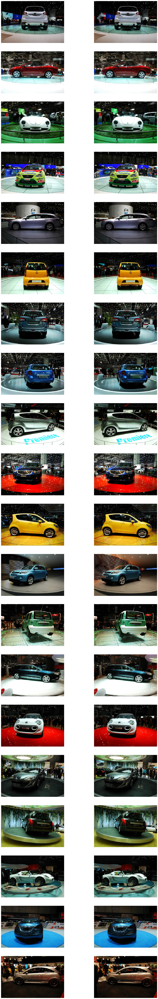

In [91]:
fig=plt.figure(figsize=(20, 120))
columns = 2
rows = 2 * nb_vehicles//columns
for i in range(1, columns*rows +1):
    ax = fig.add_subplot(rows, columns, i)
    ax.set_xticks(())
    ax.set_yticks(())
    plt.imshow(side_images[i-1])
plt.show()